# Assignment- Advanced Regression

#### Problem Statement:

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual value and flip them at a higher price. For the same purpose, the company has collected a data set from house sales in Australia. The data is provided in the csv file below.

 

The company is looking at prospective properties to buy to enter the market.

You are required to build a regression model using regularization, so as to predict the actual value of the prospective properties and decide whether to invest in them or not.

 

The company wants to know:

Which variables are significant in predicting the price of a house

How well those variables describe the price of a house

 

Also, determine the optimal value of lambda for ridge and lasso regression. 

#### Business Goal

You are required to model the price of houses with the available independent variables. It will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high rewards. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

In [131]:
# import all libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

import os

# hide warnings
import warnings
warnings.filterwarnings('ignore')

### Step 1: Reading and Understanding the Data 

In [85]:
# Reading the dataset

data = pd.read_csv('train.csv')

In [86]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [87]:
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [88]:
data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


### Step 2: Exploratory Data Analysis

##### Checking Null Values:

In [89]:
data.loc[:, data.isnull().any()].isnull().sum()

LotFrontage      259
Alley           1369
MasVnrType       872
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

In [90]:
## now let's look at the percenatage of null data across columns again before imputing them
print(round(100*(data.loc[:, data.isnull().any()].isnull().sum())/len(data.index), 2))

LotFrontage     17.74
Alley           93.77
MasVnrType      59.73
MasVnrArea       0.55
BsmtQual         2.53
BsmtCond         2.53
BsmtExposure     2.60
BsmtFinType1     2.53
BsmtFinType2     2.60
Electrical       0.07
FireplaceQu     47.26
GarageType       5.55
GarageYrBlt      5.55
GarageFinish     5.55
GarageQual       5.55
GarageCond       5.55
PoolQC          99.52
Fence           80.75
MiscFeature     96.30
dtype: float64


In [91]:
#Imputing values by looking at the data dictionary provided to us 
#and data distribution across different columns

# based on data dictionary na in Alley means 'No alley access'
data.loc[data['Alley'].isnull(),['Alley']] = 'No alley access'
# LotFrontage can never be 0. So imputing it with mean value
data.loc[data['LotFrontage'].isnull(),['LotFrontage']] = data['LotFrontage'].mean()
# based on data dictionary na in MasVnrType means 'none'
data.loc[data['MasVnrType'].isnull(),['MasVnrType']] = 'none'
# based on data dictionary where MasVnrType type is 'none' area will 0
data.loc[data['MasVnrArea'].isnull(),['MasVnrArea']] = 0
# based on data dictionary na in BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2 means ''No Basement'
data.loc[data['BsmtQual'].isnull(),['BsmtQual']] = 'No Basement'
data.loc[data['BsmtCond'].isnull(),['BsmtCond']] = 'No Basement'
data.loc[data['BsmtExposure'].isnull(),['BsmtExposure']] = "No Basement"
data.loc[data['BsmtFinType1'].isnull(),['BsmtFinType1']] = 'No Basement'
data.loc[data['BsmtFinType2'].isnull(),['BsmtFinType2']] = 'No Basement'
# based on data dictionary na in FireplaceQu means 'No Fireplace'
data.loc[data['FireplaceQu'].isnull(),['FireplaceQu']] = 'No Fireplace'
# based on data dictionary na in GarageType,GarageFinish,GarageQual,GarageCond means 'No Garage'
data.loc[data['GarageType'].isnull(),['GarageType']] = 'No Garage'
data.loc[data['GarageFinish'].isnull(),['GarageFinish']] = 'No Garage'
data.loc[data['GarageQual'].isnull(),['GarageQual']] = 'No Garage'
data.loc[data['GarageCond'].isnull(),['GarageCond']] = 'No Garage'
# based on data dictionary na in PoolQC means 'No Pool'
data.loc[data['PoolQC'].isnull(),['PoolQC']] = 'No Pool'
# based on data dictionary na in Fence means 'No Fence'
data.loc[data['Fence'].isnull(),['Fence']] = 'No Fence'
# based on data dictionary na in MiscFeature means 'none'
data.loc[data['MiscFeature'].isnull(),['MiscFeature']] = 'none'
# impute GarageYrBlt with 2019 so that while calculating age it will it will turn to 0
# age = 2019-2019 = 0
data.loc[data['GarageYrBlt'].isnull(),['GarageYrBlt']] = 2019
# impute electrical column with SBrkr as it is the most occuring value
data.loc[data['Electrical'].isnull(),['Electrical']] = "SBrkr"

#### drop duplicates

In [92]:
data = data.drop_duplicates()
print(data.shape)

(1460, 81)


#### Drop less relevant columns

In [93]:
data.nunique()

Id               1460
MSSubClass         15
MSZoning            5
LotFrontage       111
LotArea          1073
                 ... 
MoSold             12
YrSold              5
SaleType            9
SaleCondition       6
SalePrice         663
Length: 81, dtype: int64

In [94]:
data = data.drop(['Street','Utilities','PoolQC','Id'], axis=1)

In [95]:
# change data type for MSSubClass to object as it is categorical variable
data[['MSSubClass']] = data[['MSSubClass']].astype('object')

In [96]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 77 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   object 
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Alley          1460 non-null   object 
 5   LotShape       1460 non-null   object 
 6   LandContour    1460 non-null   object 
 7   LotConfig      1460 non-null   object 
 8   LandSlope      1460 non-null   object 
 9   Neighborhood   1460 non-null   object 
 10  Condition1     1460 non-null   object 
 11  Condition2     1460 non-null   object 
 12  BldgType       1460 non-null   object 
 13  HouseStyle     1460 non-null   object 
 14  OverallQual    1460 non-null   int64  
 15  OverallCond    1460 non-null   int64  
 16  YearBuilt      1460 non-null   int64  
 17  YearRemodAdd   1460 non-null   int64  
 18  RoofStyl

### Step 3: Visualising the Data

In [97]:
data_numeric = data.select_dtypes(include=['float64', 'int64'])
data_numeric.head()

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,65.0,8450,7,5,2003,2003,196.0,706,0,150,...,0,61,0,0,0,0,0,2,2008,208500
1,80.0,9600,6,8,1976,1976,0.0,978,0,284,...,298,0,0,0,0,0,0,5,2007,181500
2,68.0,11250,7,5,2001,2002,162.0,486,0,434,...,0,42,0,0,0,0,0,9,2008,223500
3,60.0,9550,7,5,1915,1970,0.0,216,0,540,...,0,35,272,0,0,0,0,2,2006,140000
4,84.0,14260,8,5,2000,2000,350.0,655,0,490,...,192,84,0,0,0,0,0,12,2008,250000


In [71]:
# Plotting a Pairplot plot

sns.pairplot(data_numeric)
plt.show()

In [81]:
# correlation matrix
cor = data_numeric.corr()
cor

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice
LotFrontage,1.000000,0.306795,0.178699,0.215828,0.043340,0.122156,0.363358,0.414266,0.072483,0.036849,0.368392,0.323663,0.077106,0.137454,0.009790,0.062335,0.037684,0.180868,0.001168,0.334901
LotArea,0.306795,1.000000,0.103321,0.214103,0.111170,-0.002618,0.260833,0.299475,0.050986,0.004779,0.263116,0.180403,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.263843
MasVnrArea,0.178699,0.103321,1.000000,0.261256,-0.071330,0.113862,0.360067,0.339850,0.173800,-0.068628,0.388052,0.370884,0.159991,0.122528,-0.109907,0.019144,0.062248,0.011928,-0.029512,0.472614
BsmtFinSF1,0.215828,0.214103,0.261256,1.000000,-0.050117,-0.495251,0.522396,0.445863,-0.137079,-0.064503,0.208171,0.296970,0.204306,0.111761,-0.102303,0.026451,0.062021,0.140491,0.003571,0.386420
BsmtFinSF2,0.043340,0.111170,-0.071330,-0.050117,1.000000,-0.209294,0.104810,0.097117,-0.099260,0.014807,-0.009640,-0.018227,0.067898,0.003093,0.036543,-0.029993,0.088871,0.041709,0.004940,-0.011378
BsmtUnfSF,0.122156,-0.002618,0.113862,-0.495251,-0.209294,1.000000,0.415360,0.317987,0.004469,0.028167,0.240257,0.183303,-0.005316,0.129005,-0.002538,0.020764,-0.012579,-0.035092,-0.023837,0.214479
TotalBsmtSF,0.363358,0.260833,0.360067,0.522396,0.104810,0.415360,1.000000,0.819530,-0.174512,-0.033245,0.454868,0.486665,0.232019,0.247264,-0.095478,0.037384,0.084489,0.126053,-0.018479,0.613581
1stFlrSF,0.414266,0.299475,0.339850,0.445863,0.097117,0.317987,0.819530,1.000000,-0.202646,-0.014241,0.566024,0.489782,0.235459,0.211671,-0.065292,0.056104,0.088758,0.131525,-0.021096,0.605852
2ndFlrSF,0.072483,0.050986,0.173800,-0.137079,-0.099260,0.004469,-0.174512,-0.202646,1.000000,0.063353,0.687501,0.138347,0.092165,0.208026,0.061989,-0.024358,0.040606,0.081487,0.016197,0.319334
LowQualFinSF,0.036849,0.004779,-0.068628,-0.064503,0.014807,0.028167,-0.033245,-0.014241,0.063353,1.000000,0.134683,-0.067601,-0.025444,0.018251,0.061081,-0.004296,0.026799,0.062157,-0.003793,-0.025606


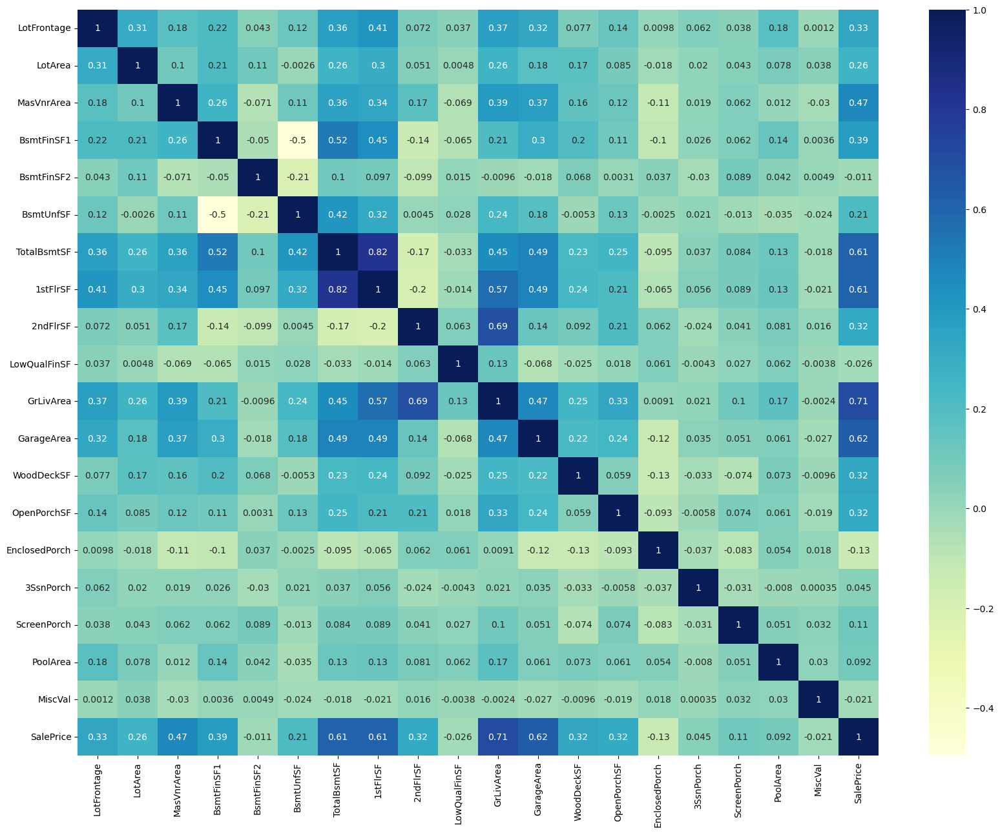

In [82]:
# plotting correlations on a heatmap
# figure size
plt.figure(figsize = (20, 15))
# heatmap
sns.heatmap(cor, cmap="YlGnBu", annot=True)
plt.show()

## Step 4 : Data Preparation

### Checking Outlier

In [98]:
data_numeric = data_numeric.drop(['GarageYrBlt','YearBuilt','YrSold',
                                              'YearRemodAdd','MoSold','BsmtFullBath',
                                              'BsmtHalfBath','FullBath','HalfBath',
                                              'BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd',
                                              'OverallQual','OverallQual','GarageCars',
                                              'OverallCond','Fireplaces'], axis=1)

In [99]:
data_numeric.describe()

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,70.049958,10516.828082,103.117123,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,180921.195890
std,22.024023,9981.264932,180.731373,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,79442.502883
min,21.000000,1300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34900.000000
25%,60.000000,7553.500000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,129975.000000
50%,70.049958,9478.500000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,163000.000000
75%,79.000000,11601.500000,164.250000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,214000.000000
max,313.000000,215245.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,755000.000000


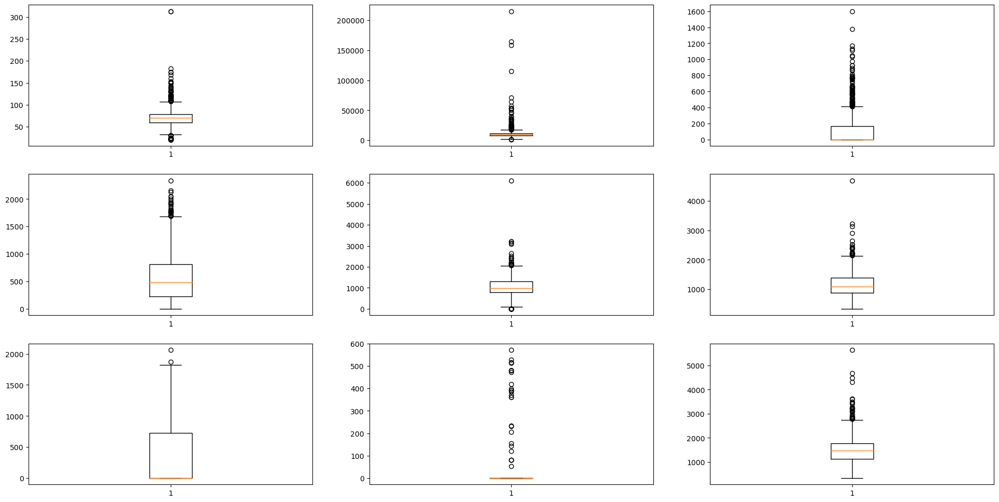

In [100]:
plt.figure(figsize=(24, 12))
plt.subplot(3,3,1)
plt.boxplot(data.LotFrontage)
plt.subplot(3,3,2)
plt.boxplot(data.LotArea)
plt.subplot(3,3,3)
plt.boxplot(data.MasVnrArea)
plt.subplot(3,3,4)
plt.boxplot(data.BsmtUnfSF)
plt.subplot(3,3,5)
plt.boxplot(data.TotalBsmtSF)
plt.subplot(3,3,6)
plt.boxplot(data['1stFlrSF'])
plt.subplot(3,3,7)
plt.boxplot(data['2ndFlrSF'])
plt.subplot(3,3,8)
plt.boxplot(data.LowQualFinSF)
plt.subplot(3,3,9)
plt.boxplot(data.GrLivArea)
plt.show()

In [101]:
# outlier treatment for LotFrontage
Q1 = data.LotFrontage.quantile(0.25)
Q3 = data.LotFrontage.quantile(0.75)
IQR = Q3 - Q1
data = data[(data.LotFrontage >= Q1 - 1.5*IQR) & (data.LotFrontage <= Q3 + 1.5*IQR)]

In [102]:
# outlier treatment for LotArea
Q1 = data.LotArea.quantile(0.25)
Q3 = data.LotArea.quantile(0.75)
IQR = Q3 - Q1
data = data[(data.LotArea >= Q1 - 1.5*IQR) & (data.LotArea <= Q3 + 1.5*IQR)]

In [103]:
# outlier treatment for PoolArea
Q1 = data.PoolArea.quantile(0.25)
Q3 = data.PoolArea.quantile(0.75)
IQR = Q3 - Q1
data = data[(data.PoolArea >= Q1 - 1.5*IQR) & (data.PoolArea <= Q3 + 1.5*IQR)]

In [104]:
# outlier treatment for MiscVal
Q1 = data.MiscVal.quantile(0.25)
Q3 = data.MiscVal.quantile(0.75)
IQR = Q3 - Q1
data = data[(data.MiscVal >= Q1 - 1.5*IQR) & (data.MiscVal <= Q3 + 1.5*IQR)]

In [105]:
data.shape

(1238, 77)

In [107]:
# We can derive age using year columns
# derive house age = 2019 - year build
data["house_age"] = 2019 - data["YearBuilt"]
# derive house age when sold in month as we have month and year both for sold house
data["house_age_when_sold_in_month"] = (((data["YrSold"]-1) - data["YearBuilt"])*12) + data["MoSold"]
# derive garage age = 2019 - year build
data["garage_age"] = 2019 - data["GarageYrBlt"]
# derive gap b/w house build and remodel = YearRemodAdd - year build
data["gap_between_build_remodel"] = data["YearRemodAdd"] - data["YearBuilt"]

In [108]:
data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,house_age,house_age_when_sold_in_month,garage_age,gap_between_build_remodel
0,60,RL,65.0,8450,No alley access,Reg,Lvl,Inside,Gtl,CollgCr,...,0,2,2008,WD,Normal,208500,16,50,16.0,0
1,20,RL,80.0,9600,No alley access,Reg,Lvl,FR2,Gtl,Veenker,...,0,5,2007,WD,Normal,181500,43,365,43.0,0
2,60,RL,68.0,11250,No alley access,IR1,Lvl,Inside,Gtl,CollgCr,...,0,9,2008,WD,Normal,223500,18,81,18.0,1
3,70,RL,60.0,9550,No alley access,IR1,Lvl,Corner,Gtl,Crawfor,...,0,2,2006,WD,Abnorml,140000,104,1082,21.0,55
4,60,RL,84.0,14260,No alley access,IR1,Lvl,FR2,Gtl,NoRidge,...,0,12,2008,WD,Normal,250000,19,96,19.0,0


In [109]:
# Drop original year and month columns after deriving columns
data = data.drop(['GarageYrBlt','YearBuilt','YrSold','YearRemodAdd','MoSold'], axis=1)

In [111]:
data.shape

(1238, 76)

## Step 5: Splitting the Data into Training and Testing Sets¶

In [112]:
# split into X and y
X = data.drop(['SalePrice'], axis=1)
Y = data['SalePrice']

In [113]:
X.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,PoolArea,Fence,MiscFeature,MiscVal,SaleType,SaleCondition,house_age,house_age_when_sold_in_month,garage_age,gap_between_build_remodel
0,60,RL,65.0,8450,No alley access,Reg,Lvl,Inside,Gtl,CollgCr,...,0,No Fence,none,0,WD,Normal,16,50,16.0,0
1,20,RL,80.0,9600,No alley access,Reg,Lvl,FR2,Gtl,Veenker,...,0,No Fence,none,0,WD,Normal,43,365,43.0,0
2,60,RL,68.0,11250,No alley access,IR1,Lvl,Inside,Gtl,CollgCr,...,0,No Fence,none,0,WD,Normal,18,81,18.0,1
3,70,RL,60.0,9550,No alley access,IR1,Lvl,Corner,Gtl,Crawfor,...,0,No Fence,none,0,WD,Abnorml,104,1082,21.0,55
4,60,RL,84.0,14260,No alley access,IR1,Lvl,FR2,Gtl,NoRidge,...,0,No Fence,none,0,WD,Normal,19,96,19.0,0


In [114]:
Y.head()

0    208500
1    181500
2    223500
3    140000
4    250000
Name: SalePrice, dtype: int64

In [115]:
# creating dummy variables for yes/no categorical variables
# we'll map yes to 1 and no to 0
binary_vars_list =  ['CentralAir']

# defining the map function
def binary_map(x):
    return x.map({'Y': 1, "N": 0})

# applying the function to column with yes /no data
X[binary_vars_list] = X[binary_vars_list].apply(binary_map)
X.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,PoolArea,Fence,MiscFeature,MiscVal,SaleType,SaleCondition,house_age,house_age_when_sold_in_month,garage_age,gap_between_build_remodel
0,60,RL,65.0,8450,No alley access,Reg,Lvl,Inside,Gtl,CollgCr,...,0,No Fence,none,0,WD,Normal,16,50,16.0,0
1,20,RL,80.0,9600,No alley access,Reg,Lvl,FR2,Gtl,Veenker,...,0,No Fence,none,0,WD,Normal,43,365,43.0,0
2,60,RL,68.0,11250,No alley access,IR1,Lvl,Inside,Gtl,CollgCr,...,0,No Fence,none,0,WD,Normal,18,81,18.0,1
3,70,RL,60.0,9550,No alley access,IR1,Lvl,Corner,Gtl,Crawfor,...,0,No Fence,none,0,WD,Abnorml,104,1082,21.0,55
4,60,RL,84.0,14260,No alley access,IR1,Lvl,FR2,Gtl,NoRidge,...,0,No Fence,none,0,WD,Normal,19,96,19.0,0


In [116]:
# seperate all categorical variables to create dummy variables
data_categorical = X.select_dtypes(include=['object'])
data_categorical.head()

,MSSubClass,MSZoning,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,Fence,MiscFeature,SaleType,SaleCondition
0,60,RL,No alley access,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,...,No Fireplace,Attchd,RFn,TA,TA,Y,No Fence,none,WD,Normal
1,20,RL,No alley access,Reg,Lvl,FR2,Gtl,Veenker,Feedr,Norm,...,TA,Attchd,RFn,TA,TA,Y,No Fence,none,WD,Normal
2,60,RL,No alley access,IR1,Lvl,Inside,Gtl,CollgCr,Norm,Norm,...,TA,Attchd,RFn,TA,TA,Y,No Fence,none,WD,Normal
3,70,RL,No alley access,IR1,Lvl,Corner,Gtl,Crawfor,Norm,Norm,...,Gd,Detchd,Unf,TA,TA,Y,No Fence,none,WD,Abnorml
4,60,RL,No alley access,IR1,Lvl,FR2,Gtl,NoRidge,Norm,Norm,...,TA,Attchd,RFn,TA,TA,Y,No Fence,none,WD,Normal


In [117]:
# convert categorical variables into dummies
data_dummies = pd.get_dummies(data_categorical, drop_first=True)
data_dummies.head()

,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,True,False,False,False,True,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,True,False
2,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,True,False,False,False,True,False
3,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False
4,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,True,False,False,False,True,False


In [119]:
# drop original categorical variables after creating dummies
X = X.drop(list(data_categorical.columns), axis=1)

In [120]:
# concat dummy variables with X
X = pd.concat([X, data_dummies], axis=1)

In [121]:
X.shape

(1238, 254)

In [122]:
X.head()

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,65.0,8450,7,5,196.0,706,0,150,856,1,...,False,False,False,False,True,False,False,False,True,False
1,80.0,9600,6,8,0.0,978,0,284,1262,1,...,False,False,False,False,True,False,False,False,True,False
2,68.0,11250,7,5,162.0,486,0,434,920,1,...,False,False,False,False,True,False,False,False,True,False
3,60.0,9550,7,5,0.0,216,0,540,756,1,...,False,False,False,False,True,False,False,False,False,False
4,84.0,14260,8,5,350.0,655,0,490,1145,1,...,False,False,False,False,True,False,False,False,True,False


In [123]:
# Scale data 
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scale_var = X.columns
X[scale_var] = scaler.fit_transform(X[scale_var])

In [124]:
# Check data after scaling
X.describe()

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,...,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000
mean,0.490261,0.486092,0.565967,0.571789,0.061637,0.197190,0.028835,0.247771,0.328368,0.930533,...,0.003231,0.004039,0.086430,0.002423,0.863489,0.003231,0.007270,0.014540,0.818255,0.088045
std,0.194104,0.193634,0.152334,0.138228,0.107650,0.193850,0.102369,0.190541,0.126750,0.254349,...,0.056773,0.063449,0.281111,0.049187,0.343469,0.056773,0.084987,0.119749,0.385790,0.283475
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.373333,0.366691,0.444444,0.500000,0.000000,0.000000,0.000000,0.102419,0.252027,1.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,0.507333,0.481141,0.555556,0.500000,0.000000,0.174132,0.000000,0.208690,0.309576,1.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,0.613333,0.608950,0.666667,0.625000,0.100000,0.324954,0.000000,0.347817,0.397848,1.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Step 6: Building model and Evaluation

In [126]:
# split data into test and train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, 
                                                    test_size = 0.2, 
                                                    random_state = 1)

In [127]:
# let's build a Linear regression model first
from sklearn import metrics
# linear regression
lm = LinearRegression()
lm.fit(X_train, y_train)

# predict
y_train_pred = lm.predict(X_train)
metrics.r2_score(y_true=y_train, y_pred=y_train_pred)

0.9450617136710324

In [128]:
y_test_pred = lm.predict(X_test)
metrics.r2_score(y_true=y_test, y_pred=y_test_pred)

-66105710534656.94

In [129]:
# model coefficients
model_parameters = list(lm.coef_)
model_parameters.insert(0, lm.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_parameters))

[('constant', -21316.955),
 ('LotFrontage', 3351.067),
 ('LotArea', 33180.776),
 ('OverallQual', 65708.031),
 ('OverallCond', 46579.989),
 ('MasVnrArea', 19879.849),
 ('BsmtFinSF1', -3.418603177819694e+16),
 ('BsmtFinSF2', -2.30302608963038e+16),
 ('BsmtUnfSF', -3.649843246525463e+16),
 ('TotalBsmtSF', 5.009159866600369e+16),
 ('CentralAir', 83.5),
 ('1stFlrSF', 2232168331924086.5),
 ('2ndFlrSF', 1242578846851448.0),
 ('LowQualFinSF', 407251167672089.75),
 ('GrLivArea', -2401085009285799.0),
 ('BsmtFullBath', 714.125),
 ('BsmtHalfBath', 123.562),
 ('FullBath', 12131.0),
 ('HalfBath', 4918.5),
 ('BedroomAbvGr', -35416.0),
 ('KitchenAbvGr', -19335.5),
 ('TotRmsAbvGrd', 12762.125),
 ('Fireplaces', 11366.375),
 ('GarageCars', 27306.0),
 ('GarageArea', 2813.625),
 ('WoodDeckSF', 8987.0),
 ('OpenPorchSF', 6860.0),
 ('EnclosedPorch', 13258.5),
 ('3SsnPorch', 15219.0),
 ('ScreenPorch', 11371.75),
 ('PoolArea', -5265470146147655.0),
 ('MiscVal', 512775945487811.0),
 ('house_age', -5019.0),
 ('h

### Lasso regression

In [132]:
# lasso regression without tuning hyper parameter
lm = Lasso(alpha=0.001)
lm.fit(X_train, y_train)

# predict
y_train_pred = lm.predict(X_train)
print(metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(metrics.r2_score(y_true=y_test, y_pred=y_test_pred))

0.9450546775849463
0.9175497540419792


In [133]:
# lasso model parameters without tuning hyper parameter
model_parameters = list(lm.coef_)
model_parameters.insert(0, lm.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_parameters))

[('constant', -21025.946),
 ('LotFrontage', 3323.708),
 ('LotArea', 33242.188),
 ('OverallQual', 65586.294),
 ('OverallCond', 46466.621),
 ('MasVnrArea', 19864.105),
 ('BsmtFinSF1', 76583.462),
 ('BsmtFinSF2', 28380.738),
 ('BsmtUnfSF', 31817.621),
 ('TotalBsmtSF', 32418.725),
 ('CentralAir', 133.699),
 ('1stFlrSF', 107134.117),
 ('2ndFlrSF', 79607.389),
 ('LowQualFinSF', 15190.098),
 ('GrLivArea', 25462.674),
 ('BsmtFullBath', 582.578),
 ('BsmtHalfBath', 92.215),
 ('FullBath', 11949.469),
 ('HalfBath', 4841.605),
 ('BedroomAbvGr', -35375.468),
 ('KitchenAbvGr', -19606.106),
 ('TotRmsAbvGrd', 13022.147),
 ('Fireplaces', 11282.912),
 ('GarageCars', 27341.618),
 ('GarageArea', 2826.119),
 ('WoodDeckSF', 8894.292),
 ('OpenPorchSF', 7014.859),
 ('EnclosedPorch', 13441.156),
 ('3SsnPorch', 15079.134),
 ('ScreenPorch', 11324.015),
 ('PoolArea', 0.0),
 ('MiscVal', 0.0),
 ('house_age', -29880.811),
 ('house_age_when_sold_in_month', -56823.867),
 ('garage_age', 977.149),
 ('gap_between_build_re

This model is clearly overfitting. So let's tune the alpha / hyper parameter to get balanced model.

In [135]:
# Now let's do k fold with r2 score and tune hyper parameter
# grid search CV
from sklearn.model_selection import KFold
# set up cross validation scheme
folds = KFold(n_splits = 5, shuffle = True, random_state = 4)

# specify range of hyperparameters
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 200]}

# grid search
# lasso model
model = Lasso()
model_cv = GridSearchCV(estimator = model, param_grid = params, 
                        scoring= 'r2', 
                        cv = folds, 
                        return_train_score=True, verbose = 1)            
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 27 candidates, totalling 135 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 200]},
             return_train_score=True, scoring='r2', verbose=1)

In [136]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.074716,0.005960,0.012540,0.006271,0.0001,{'alpha': 0.0001},0.893075,0.907464,0.884704,0.887436,...,0.891825,0.008307,27,0.946436,0.945179,0.947924,0.950322,0.954050,0.948782,0.003141
1,0.069408,0.006079,0.003365,0.006205,0.001,{'alpha': 0.001},0.893083,0.907477,0.884711,0.887442,...,0.891833,0.008310,26,0.946436,0.945179,0.947924,0.950322,0.954050,0.948782,0.003141
2,0.075970,0.004673,0.010749,0.006359,0.01,{'alpha': 0.01},0.893173,0.907555,0.884770,0.887500,...,0.891896,0.008322,25,0.946436,0.945179,0.947924,0.950322,0.954050,0.948782,0.003141
3,0.070914,0.007119,0.009378,0.007657,0.05,{'alpha': 0.05},0.893582,0.907772,0.885094,0.887696,...,0.892145,0.008327,24,0.946436,0.945177,0.947922,0.950322,0.954049,0.948781,0.003142
4,0.073982,0.010095,0.003126,0.006251,0.1,{'alpha': 0.1},0.894060,0.908019,0.885466,0.887728,...,0.892395,0.008356,23,0.946435,0.945174,0.947920,0.950321,0.954048,0.948780,0.003142


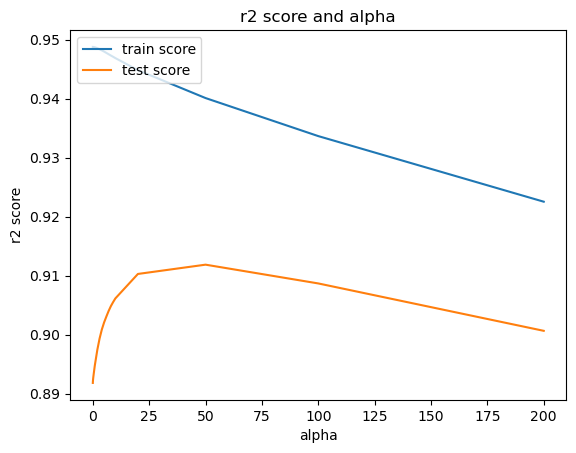

In [138]:
# plot to choose optimal value of aplha / hyper parameter
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('r2 score')
plt.title("r2 score and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [139]:
# Now let's do k fold with neg_mean_absolute_error score and tune hyper parameter
# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 200]}
lasso = Lasso()

# cross validation
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 27 candidates, totalling 135 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 200]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [140]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.082456,0.006452,0.003125,0.006249,0.0001,{'alpha': 0.0001},-15320.556754,-17282.997126,-16206.784674,-15254.310848,...,-16665.314552,1492.210688,27,-11416.331505,-11032.563819,-11362.197147,-11348.273045,-10277.077129,-11087.288529,426.941273
1,0.071967,0.007738,0.006249,0.007654,0.001,{'alpha': 0.001},-15320.323297,-17283.843653,-16206.355027,-15253.881840,...,-16665.179937,1492.281689,26,-11416.329292,-11032.562627,-11362.213210,-11348.284463,-10277.093177,-11087.296554,426.938336
2,0.069934,0.006666,0.009374,0.007654,0.01,{'alpha': 0.01},-15317.082974,-17282.661256,-16202.086988,-15249.590834,...,-16661.910937,1492.671862,25,-11416.330348,-11032.637245,-11362.528724,-11348.503812,-10277.418589,-11087.483744,426.880545
3,0.075022,0.006212,0.003125,0.006249,0.05,{'alpha': 0.05},-15300.201191,-17261.076393,-16180.560515,-15234.594078,...,-16644.864696,1494.525067,24,-11416.542600,-11033.177044,-11364.156409,-11349.475824,-10278.935271,-11088.457430,426.652658
4,0.081293,0.006323,0.004155,0.006076,0.1,{'alpha': 0.1},-15279.251625,-17237.755351,-16154.169391,-15231.334839,...,-16627.575252,1494.286746,23,-11417.272558,-11033.864845,-11365.927910,-11350.910678,-10281.034817,-11089.802162,426.355145


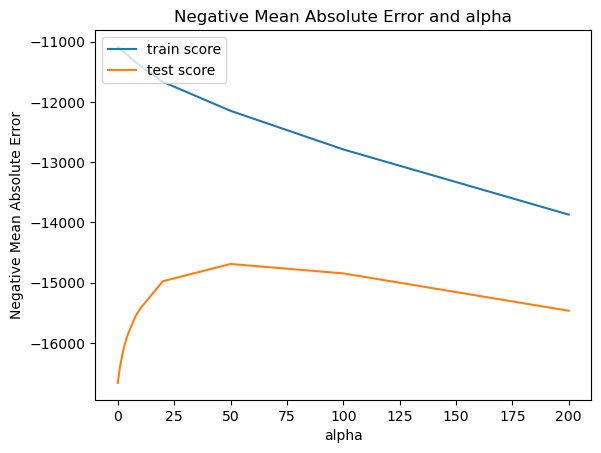

In [141]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')

plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

From both the plots we have seen that optimal value for alpha is 50. So let's use this value of alpha for regularization.

In [143]:
# model with optimal alpha = 50
# lasso regression
lm = Lasso(alpha=50)
lm.fit(X_train, y_train)


# predict
y_train_pred = lm.predict(X_train)
print(metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(metrics.r2_score(y_true=y_test, y_pred=y_test_pred))

0.9372262154269734
0.9254192143047315


In [144]:
# lasso model parameters with alpha = 50
model_parameters = list(lm.coef_)
model_parameters.insert(0, lm.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_parameters))

[('constant', 34528.911),
 ('LotFrontage', 3844.871),
 ('LotArea', 29704.867),
 ('OverallQual', 72027.532),
 ('OverallCond', 48349.26),
 ('MasVnrArea', 15203.433),
 ('BsmtFinSF1', 40157.856),
 ('BsmtFinSF2', 0.0),
 ('BsmtUnfSF', -0.0),
 ('TotalBsmtSF', 61430.772),
 ('CentralAir', 1116.313),
 ('1stFlrSF', 0.0),
 ('2ndFlrSF', 0.0),
 ('LowQualFinSF', -12258.595),
 ('GrLivArea', 155902.702),
 ('BsmtFullBath', 1739.33),
 ('BsmtHalfBath', -0.0),
 ('FullBath', 9612.811),
 ('HalfBath', 6115.421),
 ('BedroomAbvGr', -20440.161),
 ('KitchenAbvGr', -9621.54),
 ('TotRmsAbvGrd', 0.0),
 ('Fireplaces', 7383.657),
 ('GarageCars', 23926.331),
 ('GarageArea', 4451.242),
 ('WoodDeckSF', 5724.092),
 ('OpenPorchSF', 4504.934),
 ('EnclosedPorch', 2952.06),
 ('3SsnPorch', 0.0),
 ('ScreenPorch', 6233.644),
 ('PoolArea', 0.0),
 ('MiscVal', 0.0),
 ('house_age', -41191.673),
 ('house_age_when_sold_in_month', -24091.907),
 ('garage_age', -325.685),
 ('gap_between_build_remodel', 9840.738),
 ('MSSubClass_30', 0.0),

With optimal value of alpha = 50, we got following score for train and test data set.

R2 for train : 0.9372405328256925
R2 for test : 0.9254664123086983

This score looks good and we can conclude that model is not overfitting.

### Ridge Regression

In [145]:
# ridge regression without tuning hyper parameter
lm = Ridge(alpha=0.001)
lm.fit(X_train, y_train)

# predict
y_train_pred = lm.predict(X_train)
print(metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(metrics.r2_score(y_true=y_test, y_pred=y_test_pred))

0.9450619294465142
0.9175747596949031


In [148]:
lm.fit(X_train, y_train)
lm.coef_

array([ 3.33025472e+03,  3.31796258e+04,  6.56738170e+04,  4.65050461e+04,
        1.99250077e+04,  5.92122050e+04,  1.68172963e+04,  1.33798894e+04,
        5.78915848e+04,  1.07470515e+02,  5.63094550e+04,  5.14357955e+04,
        5.77496590e+03,  7.99459722e+04,  6.99872463e+02,  1.03034464e+02,
        1.21331511e+04,  4.95568497e+03, -3.54178450e+04, -1.93952049e+04,
        1.27672018e+04,  1.13702561e+04,  2.72823043e+04,  2.86257467e+03,
        8.96651892e+03,  6.87868270e+03,  1.32837255e+04,  1.51931611e+04,
        1.13706533e+04,  0.00000000e+00,  0.00000000e+00, -6.11481981e+03,
       -7.96475653e+04,  9.42349956e+02,  1.64343934e+04,  2.16749328e+03,
        1.40755338e+04, -9.68747378e+03, -3.01080048e+03,  1.93655832e+03,
        2.35284639e+03,  2.19229151e+04, -4.59699443e+03,  1.37842185e+03,
       -8.12186622e+03, -8.98225301e+03, -1.72846167e+04, -3.87212323e+03,
        2.12726307e+04,  4.53408595e+04,  2.93834321e+04,  2.40846449e+04,
        2.18026261e+04, -

This model is clearly overfitting. So let's tune the alpha / hyper parameter to get balanced model.

In [149]:
# Now let's do k fold with r2 score and tune hyper parameter

# list of alphas to tune
params = {'alpha': [0.001, 0.01, 1.0, 5.0, 10.0]}

ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'r2', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 5 candidates, totalling 25 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.001, 0.01, 1.0, 5.0, 10.0]},
             return_train_score=True, scoring='r2', verbose=1)

In [150]:
# results data frame
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.011909,0.006118,0.007106,0.007066,0.001,{'alpha': 0.001},0.907200,0.872627,0.884562,0.860452,...,0.882777,0.015750,5,0.945685,0.951798,0.948697,0.953253,0.946626,0.949212,0.002912
1,0.008572,0.007151,0.007268,0.007071,0.01,{'alpha': 0.01},0.908504,0.874185,0.886971,0.861907,...,0.884347,0.015692,4,0.945677,0.951792,0.948670,0.953244,0.946610,0.949199,0.002915
2,0.009807,0.007156,0.006278,0.007689,1.0,{'alpha': 1.0},0.920371,0.901600,0.917485,0.875623,...,0.904092,0.015892,1,0.942742,0.948496,0.944718,0.950480,0.943888,0.946065,0.002933
3,0.012502,0.006251,0.009403,0.007678,5.0,{'alpha': 5.0},0.913228,0.907674,0.926522,0.868768,...,0.903982,0.019221,2,0.932831,0.937908,0.933579,0.941175,0.934783,0.936055,0.003092
4,0.012570,0.006287,0.006249,0.007654,10.0,{'alpha': 10.0},0.901218,0.904709,0.923982,0.856201,...,0.896261,0.022227,3,0.922275,0.926857,0.922036,0.931443,0.925155,0.925553,0.003454


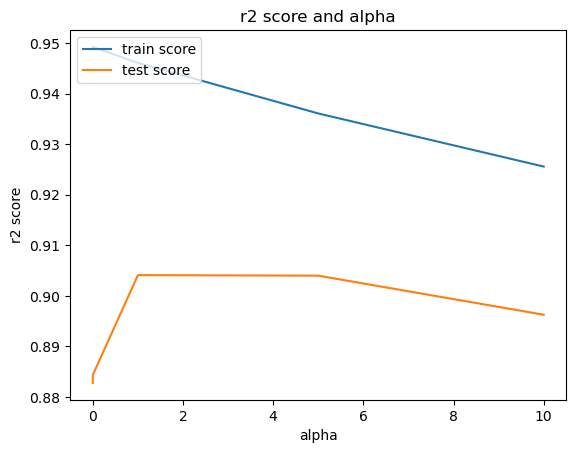

In [151]:
# plotting mean test and train scoes with alpha to tune hyper parameter
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('r2 score')
plt.title("r2 score and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [152]:
# Now let's do k fold with neg_mean_absolute_error score and tune hyper parameter

# list of alphas to tune
params = {'alpha': [0.001, 0.01, 1.0, 5.0, 10.0]}

ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 5 candidates, totalling 25 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.001, 0.01, 1.0, 5.0, 10.0]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [153]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.015792,0.000317,0.007646,0.006986,0.001,{'alpha': 0.001},-15773.583700,-18060.394949,-18830.003056,-17418.481221,...,-17332.945957,1074.505284,5,-11174.008663,-10845.430515,-10692.871340,-11002.121549,-11592.607875,-11061.407988,310.107286
1,0.014186,0.002158,0.003744,0.006060,0.01,{'alpha': 0.01},-15670.055795,-17944.757744,-18634.116989,-17313.372825,...,-17207.127401,1048.115288,4,-11178.110458,-10849.870623,-10699.053063,-11004.332584,-11593.438032,-11064.960952,308.518741
2,0.012522,0.006261,0.003123,0.006247,1.0,{'alpha': 1.0},-14565.561504,-15431.811993,-15795.357275,-16122.611559,...,-15370.830576,562.888244,2,-11481.603296,-11226.547791,-11097.753642,-11282.507109,-11816.604855,-11381.003338,250.462551
3,0.012498,0.006249,0.006250,0.007655,5.0,{'alpha': 5.0},-14839.536439,-14962.340046,-14985.566246,-16379.046402,...,-15174.111135,610.761380,1,-12470.033774,-12210.924193,-12217.185124,-12294.179780,-12590.154967,-12356.495568,149.645796
4,0.012500,0.006250,0.006260,0.007667,10.0,{'alpha': 10.0},-15501.655926,-15169.542664,-15179.501879,-16959.016876,...,-15653.121077,667.138611,3,-13495.900206,-13235.410277,-13283.320202,-13203.588211,-13448.317924,-13333.307364,117.109757


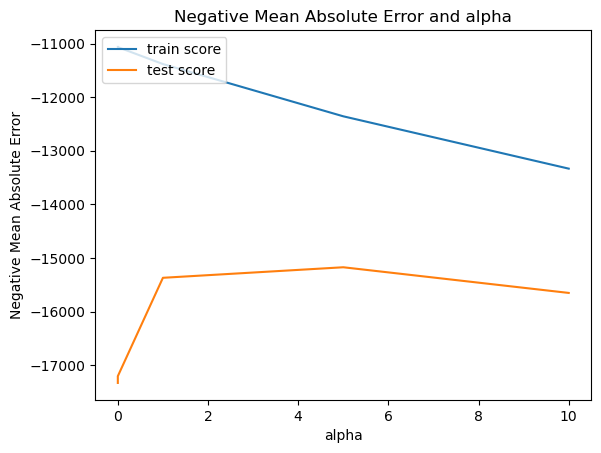

In [154]:
# plotting mean test and train scoes with alpha to tune hyper parameter
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

From both the plots we have seen that optimal value for alpha is between 1 to 5. So let's use alpha = 4.

In [156]:
# model with optimal alpha = 4
# ridge regression
lm = Ridge(alpha=4)
lm.fit(X_train, y_train)


# predict
y_train_pred = lm.predict(X_train)
print(metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(metrics.r2_score(y_true=y_test, y_pred=y_test_pred))

0.9371108140985097
0.9253894969668616


In [157]:
# coefficients for optimal value of alpha = 4
ridge.fit(X_train, y_train)
ridge.coef_

array([ 5.32311019e+03,  2.99230380e+04,  6.05584829e+04,  4.08045785e+04,
        1.96697250e+04,  5.18077047e+04,  9.91196115e+03,  1.15970461e+04,
        4.83643757e+04,  2.64061336e+03,  5.44800273e+04,  4.13296651e+04,
       -4.74425733e+03,  7.12310702e+04,  3.13407151e+03, -8.68063018e+02,
        1.67431148e+04,  8.63020001e+03, -2.36456967e+04, -1.44908206e+04,
        1.54474751e+04,  1.24792951e+04,  2.29545271e+04,  1.08802713e+04,
        8.37470290e+03,  8.48166589e+03,  8.56264522e+03,  1.22739608e+04,
        1.01809870e+04,  0.00000000e+00,  0.00000000e+00, -3.18651763e+04,
       -3.38941193e+04,  1.68045014e+03,  1.34872906e+04,  9.19855495e+02,
        7.55723896e+03,  3.56451969e+03,  2.95880239e+03,  3.52022936e+03,
        3.06191586e+03, -1.23979308e+03, -3.02582406e+03, -1.08863188e+03,
       -8.85643938e+03, -4.63106414e+03, -1.22594454e+04, -1.00033437e+03,
       -4.60315563e+03,  2.52377617e+04,  1.34295672e+04,  1.02591131e+04,
        7.69915449e+03,  

With optimal value of alpha = 4 for ridge regression, we got following score for train and test data set.

R2 for train : 0.9371096095852764
R2 for test : 0.9253982765709686

This score looks good and we can conclude that model is not overfitting.

In [160]:
### Ridge regression after variable shrinkage done by lasso

Now as we know that lasso does variable selection as well in which it make variable coefficient to 0. So let's use all the variables whose coefficient is greater than 0 after doing lasso regression.

In [163]:
# let's take new X with all variables whose coefficient is not zero after lasso regression
X_new = X[['LotFrontage','LotArea','OverallQual','OverallCond','MasVnrArea','BsmtFinSF1','TotalBsmtSF',
'CentralAir','LowQualFinSF','GrLivArea','BsmtFullBath','FullBath','HalfBath','BedroomAbvGr',
 'KitchenAbvGr','Fireplaces','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF',
 'EnclosedPorch','ScreenPorch','house_age','house_age_when_sold_in_month','garage_age',
'gap_between_build_remodel','MSSubClass_45','MSSubClass_50','MSSubClass_60','MSSubClass_90',
'MSSubClass_120','MSSubClass_160','MSZoning_FV','MSZoning_RL','MSZoning_RM',
 'Alley_No alley access','LotShape_Reg','LandContour_Low','LotConfig_CulDSac','LotConfig_FR2',
 'LotConfig_Inside','LandSlope_Mod','Neighborhood_BrkSide','Neighborhood_CollgCr',
 'Neighborhood_Crawfor','Neighborhood_Edwards','Neighborhood_Gilbert','Neighborhood_Mitchel',
'Neighborhood_NAmes','Neighborhood_NWAmes','Neighborhood_NoRidge','Neighborhood_NridgHt',
'Neighborhood_OldTown','Neighborhood_StoneBr','Neighborhood_Timber','Condition1_Feedr',
 'Condition1_Norm','Condition1_PosA','Condition1_PosN','Condition1_RRAe','BldgType_2fmCon',
'BldgType_Duplex','BldgType_Twnhs','BldgType_TwnhsE','HouseStyle_1Story','HouseStyle_2.5Fin',
'HouseStyle_2.5Unf','HouseStyle_2Story','HouseStyle_SFoyer','RoofStyle_Gable',
 'RoofStyle_Mansard','Exterior1st_BrkFace','Exterior1st_HdBoard','Exterior1st_MetalSd',
'Exterior1st_Plywood','Exterior1st_Wd Sdng','Exterior2nd_VinylSd','Exterior2nd_Wd Sdng',
 'Exterior2nd_Wd Shng','Exterior2nd_CmentBd','Exterior2nd_Plywood','Exterior2nd_Stucco',
'Exterior2nd_VinylSd','Exterior2nd_Wd Sdng','Exterior2nd_Wd Shng',
 'MasVnrType_Stone','ExterQual_Fa','ExterQual_Gd','ExterQual_TA','ExterCond_Gd',
 'Foundation_PConc','BsmtQual_Fa','BsmtQual_Gd','BsmtQual_TA','BsmtExposure_Gd',
 'BsmtExposure_No','BsmtFinType1_BLQ','BsmtFinType1_GLQ','BsmtFinType1_LwQ','BsmtFinType1_Rec',
'BsmtFinType1_Unf','BsmtFinType2_LwQ','BsmtFinType2_Unf','Heating_GasA','HeatingQC_Fa',
'HeatingQC_Gd','HeatingQC_TA','Electrical_FuseF','KitchenQual_Fa','KitchenQual_Gd',
 'KitchenQual_TA','Functional_Mod','Functional_Typ','FireplaceQu_Fa','FireplaceQu_Gd',
 'FireplaceQu_Po','GarageType_Attchd','GarageType_BuiltIn','GarageType_Detchd',
 'GarageType_No Garage','GarageFinish_RFn','GarageQual_Fa','GarageQual_Gd','GarageQual_No Garage',
'GarageCond_Fa','GarageCond_No Garage','PavedDrive_P','PavedDrive_Y','Fence_GdWo','Fence_MnPrv',
 'Fence_No Fence','SaleType_WD','SaleCondition_Alloca','SaleCondition_Family',
 'SaleCondition_Normal','SaleCondition_Partial']]


In [164]:
# check shape for new X
X_new.shape

(1238, 136)

In [165]:
X_new.describe()

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,TotalBsmtSF,CentralAir,LowQualFinSF,GrLivArea,...,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_No Fence,SaleType_WD,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,...,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000
mean,0.490261,0.486092,0.565967,0.571789,0.061637,0.197190,0.328368,0.930533,0.009690,0.372755,...,0.018578,0.920032,0.038772,0.109855,0.806947,0.863489,0.007270,0.014540,0.818255,0.088045
std,0.194104,0.193634,0.152334,0.138228,0.107650,0.193850,0.126750,0.254349,0.086552,0.154419,...,0.135085,0.271353,0.193130,0.312835,0.394854,0.343469,0.084987,0.119749,0.385790,0.283475
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.373333,0.366691,0.444444,0.500000,0.000000,0.000000,0.252027,1.000000,0.000000,0.254176,...,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,0.507333,0.481141,0.555556,0.500000,0.000000,0.174132,0.309576,1.000000,0.000000,0.360424,...,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,0.613333,0.608950,0.666667,0.625000,0.100000,0.324954,0.397848,1.000000,0.000000,0.460649,...,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [167]:
# Split test and train again using new X
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_new, Y, 
                                                    test_size = 0.2, 
                                                    random_state = 1)

In [168]:
# Now let's do k fold with r2 score and tune hyper parameter
# list of alphas to tune
params = {'alpha': [0.001, 0.01, 1.0, 5.0, 10.0]}

ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'r2', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 5 candidates, totalling 25 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.001, 0.01, 1.0, 5.0, 10.0]},
             return_train_score=True, scoring='r2', verbose=1)

In [169]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.003776,0.003465,0.002874,0.002886,0.001,{'alpha': 0.001},0.928764,0.908585,0.924323,0.882623,...,0.912725,0.016484,3,0.939543,0.944891,0.940426,0.947564,0.940692,0.942623,0.003086
1,0.009372,0.007652,0.000000,0.000000,0.01,{'alpha': 0.01},0.928811,0.908745,0.924693,0.882829,...,0.912936,0.016485,2,0.939543,0.944890,0.940417,0.947561,0.940686,0.942619,0.003086
2,0.009364,0.007646,0.003124,0.006249,1.0,{'alpha': 1.0},0.928202,0.912621,0.929511,0.881072,...,0.914061,0.017621,1,0.937659,0.942951,0.938516,0.946000,0.939107,0.940847,0.003150
3,0.003083,0.003202,0.003765,0.006058,5.0,{'alpha': 5.0},0.914836,0.910447,0.929621,0.867966,...,0.906366,0.020545,4,0.927132,0.932224,0.927602,0.936671,0.929811,0.930688,0.003496
4,0.006259,0.007666,0.003123,0.006246,10.0,{'alpha': 10.0},0.899160,0.904984,0.924037,0.853199,...,0.895737,0.023281,5,0.915557,0.920210,0.915277,0.925941,0.919130,0.919223,0.003876


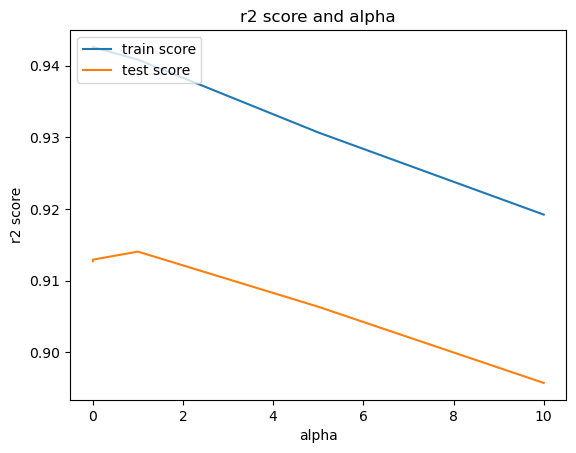

In [170]:
# plotting mean test and train scoes with alpha to tune hyper parameter
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('r2 score')
plt.title("r2 score and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [171]:
# Now let's do k fold with neg_mean_absolute_error score and tune hyper parameter

# list of alphas to tune
params = {'alpha': [0.001, 0.01, 1.0, 5.0, 10.0]}

ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 5 candidates, totalling 25 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.001, 0.01, 1.0, 5.0, 10.0]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [172]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.007751,0.006554,0.001398,0.001713,0.001,{'alpha': 0.001},-13690.564036,-14824.117444,-15474.407680,-15616.666945,...,-14657.747370,836.630550,3,-11928.114392,-11857.585792,-11781.435904,-11822.413057,-12337.412452,-11945.392320,201.838501
1,0.015623,0.000005,0.000000,0.000000,0.01,{'alpha': 0.01},-13683.335897,-14797.751058,-15434.671342,-15590.105349,...,-14631.923704,830.258711,2,-11924.935665,-11857.740960,-11773.623220,-11823.573084,-12331.891259,-11942.352837,200.888538
2,0.006249,0.007654,0.006240,0.007642,1.0,{'alpha': 1.0},-13592.098359,-14076.829060,-14848.960262,-15470.467575,...,-14308.305286,745.612516,1,-11965.269682,-11936.152105,-11721.199755,-11898.554336,-12232.172126,-11950.669601,164.341111
3,0.009966,0.006204,0.002326,0.003004,5.0,{'alpha': 5.0},-14411.442388,-14455.366919,-14637.692310,-16351.142432,...,-14832.266200,766.977895,4,-13012.377731,-12881.958282,-12807.153706,-12812.414842,-13004.677002,-12903.716313,89.592491
4,0.006246,0.007650,0.000000,0.000000,10.0,{'alpha': 10.0},-15575.056891,-15220.633952,-15154.757328,-17092.388247,...,-15664.547707,728.235552,5,-14103.035201,-13907.925918,-13929.330566,-13866.771138,-14015.039618,-13964.420488,84.539541


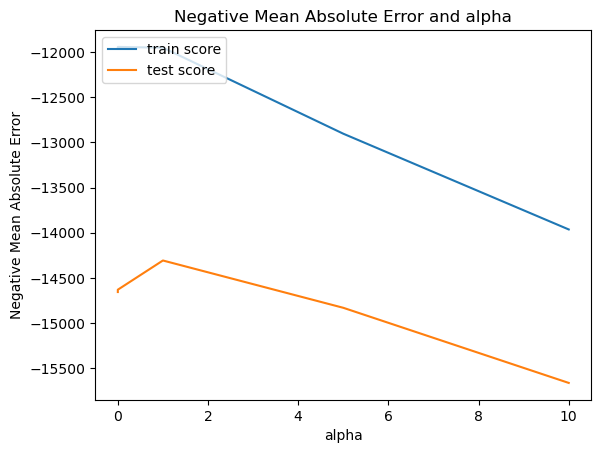

In [173]:
# plotting mean test and train scoes with alpha to tune hyper parameter
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

In [174]:
# model with optimal alpha = 1
# lasso regression
lm = Ridge(alpha=1)
lm.fit(X_train, y_train)

# predict
y_train_pred = lm.predict(X_train)
print(metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(metrics.r2_score(y_true=y_test, y_pred=y_test_pred))

0.9390003127403764
0.9243233243092688


In [175]:
ridge.fit(X_train, y_train)
ridge.coef_

array([ 5.19547532e+03,  3.13274473e+04,  6.49905490e+04,  4.38985056e+04,
        1.21659592e+04,  4.19077807e+04,  6.11838764e+04,  1.62036796e+03,
       -1.26691470e+04,  1.29714239e+05,  3.60937480e+03,  2.04649340e+04,
        1.05478588e+04, -1.39194918e+04, -1.19620194e+04,  1.02963934e+04,
        2.35953394e+04,  1.25939527e+04,  7.79850828e+03,  9.10307870e+03,
        6.13061752e+03,  8.58138044e+03, -3.18326675e+04, -3.36609130e+04,
        3.10761625e+03,  1.55902351e+04,  4.55174113e+03,  3.56447639e+03,
        1.70824837e+03, -8.33690437e+03, -2.60956817e+03, -1.53851075e+04,
        1.61987432e+04,  3.66328720e+03, -3.39929932e+01,  1.47039691e+03,
        3.07412517e+03, -1.61336573e+04,  4.20393257e+03, -9.49551470e+03,
       -1.30875235e+03,  7.15799219e+03,  8.35056289e+03, -4.26579870e+03,
        2.35876759e+04, -1.11571078e+04, -8.28190672e+03, -1.33749131e+04,
       -6.06466869e+03, -1.44843625e+04,  1.96003849e+04,  7.70013608e+03,
       -3.94552921e+03,  

With optimal value of alpha = 1 for ridge regression on variables selected by lasso regession, we got following score for train and test data set.

R2 for train : 0.9392476999525955
R2 for test : 0.9231948226312643

This score looks good and we can conclude that model is not overfitting. And this score is pretty close to previous ridge regression model.

# Conclusion

Optimal value of alpha of lasso regression is 50 and r2 score for optimal value of alpha is given below

R2 score for train : 0.9372405328256925
R2 score for test : 0.9254664123086983

Optimal value of alpha of ridge regression is 4 and r2 score for optimal value of alpha is given below

R2 score for train : 0.9371096095852764
R2 score for test : 0.9253982765709686

Optimal value of alpha is 1 for ridge regression on variables selected by lasso regession and r2 score for optimal value of alpha is given below

R2 score for train : 0.9392476999525955
R2 score for test : 0.9231948226312643


Lasso has successfully reduced variables by shrinking the variable coefficient to 0.There are 134 variables selected by lasso regression out of 255 variables. 